In [1]:
import pandas as pd
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from ydata_profiling import ProfileReport#
import seaborn as sns
%matplotlib inline
import matplotlib.pyplot as plt
import plotly.figure_factory as ff
import os

In [2]:
df = pd.read_csv('Raw/Final.csv')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4849 entries, 0 to 4848
Data columns (total 28 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   Name                              4849 non-null   object 
 1   Price                             4849 non-null   int64  
 2   Stars                             4849 non-null   float64
 3   Score                             4849 non-null   float64
 4   SpokenLanguages                   4849 non-null   object 
 5   Reviews                           4849 non-null   int64  
 6   Location                          4849 non-null   object 
 7   Sparkling clean                   4849 non-null   int64  
 8   NewlyBuilt                        4849 non-null   int64  
 9   ExcellentView                     4849 non-null   int64  
 10  Check In 24/7                     4849 non-null   int64  
 11  AirportTransfer                   4849 non-null   int64  
 12  Front 

In [3]:
profile = ProfileReport(df, title="Pandas Profiling Report")# used to generate a Pandas Profiling report.
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]


# Conclusion
From the previous analysis we can find alot of interesting stuff like:

## NewlyBuilt is highly imbalanced

In [4]:
figA = go.Figure(data=[go.Pie(labels=['Old building','Newly Built'],
                             values=list(df.NewlyBuilt.value_counts()),
                             textinfo='label+percent')])
figA.show()
#due to dynamic graph please look at plot fig1.html

In [5]:
# Create subplots: use 'domain' type for Pie subplot
figB = make_subplots(rows=1, cols=5, specs=[[{'type':'domain'}]*5])

for idx, city in enumerate(['Bangkok', 'Phuket', 'Koh Samui', 'Ko Phi Phi', 'Ko Pha-ngan'], start=1):
    figB.add_trace(go.Pie(labels=['Old building', 'Newly Built'],
                         values=list(df[df.Origin == city].NewlyBuilt.value_counts()),
                         name=city), 1, idx)

# Use `hole` to create a donut-like pie chart
figB.update_traces(hole=.8, hoverinfo="label+percent+name")

figB.update_layout(title_text="Construction boom in Thailand",
                  annotations=[dict(text='Bangkok', x=0.02, y=0.5, font_size=20, showarrow=False),
                               dict(text='Phuket', x=0.24, y=0.5, font_size=20, showarrow=False),
                               dict(text='Koh<br>Samui', x=0.5, y=0.5, font_size=20, showarrow=False),
                               dict(text='Ko<br>Phi Phi', x=0.75, y=0.51, font_size=20, showarrow=False),
                               dict(text='Ko<br>Pha-ngan', x=0.985, y=0.52, font_size=20, showarrow=False)])
figB.show()

## High corolation between Real Guest columns

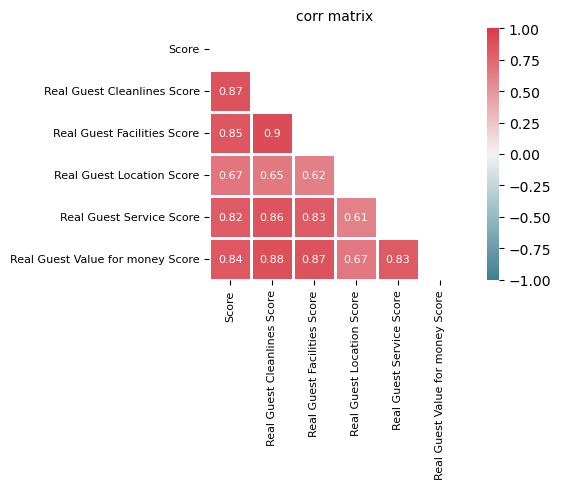

In [6]:
corr = df[['Score',
           'Real Guest Cleanlines Score',
           'Real Guest Facilities Score',
           'Real Guest Location Score',
           'Real Guest Service Score',
           'Real Guest Value for money Score']].corr()

mask = np.triu(np.ones_like(corr, dtype=bool))
f, ax = plt.subplots(figsize=(7,5))
cmap = sns.diverging_palette(220, 10, as_cmap=True)
# cmap = sns.color_palette('colorblind', as_cmap=True)
sns.heatmap(corr,
           mask=mask,
           cmap=cmap,
           vmax=1.0,
           vmin=-1.0,
           center=0,
           square=True,
           linewidths=.9,
           annot_kws={'fontsize': 8},
           annot=True,
           )
plt.title('corr matrix', fontsize=10)
plt.xticks(fontsize=8)
plt.yticks(fontsize=8, rotation=0)
plt.tight_layout()
plt.show()

In [7]:
mask

array([[ True,  True,  True,  True,  True,  True],
       [False,  True,  True,  True,  True,  True],
       [False, False,  True,  True,  True,  True],
       [False, False, False,  True,  True,  True],
       [False, False, False, False,  True,  True],
       [False, False, False, False, False,  True]])

# Exploring Relationships: Score, Booked Today, and Price Analysis

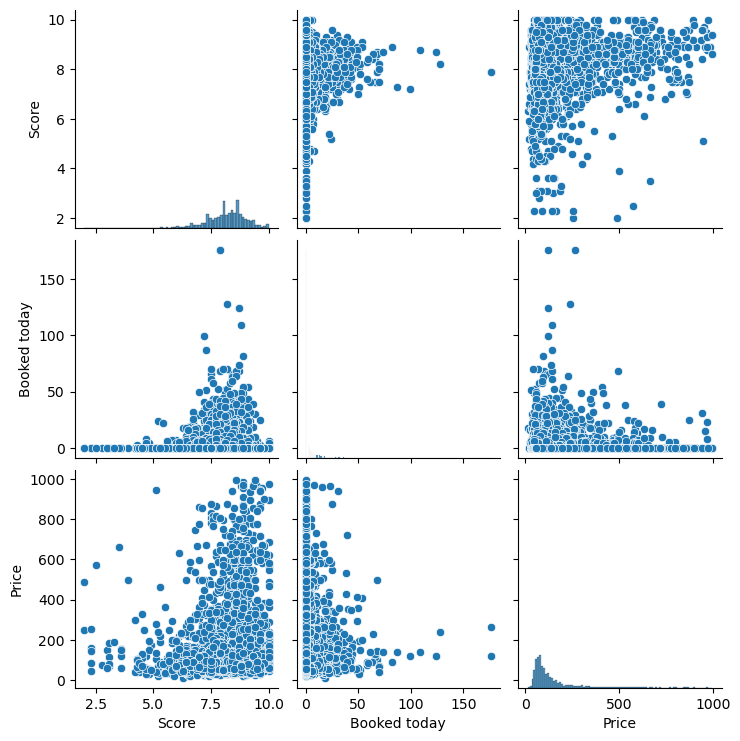

In [8]:
sns.pairplot(df[['Score',"Booked today","Price"]])

## 'Real guest' criterias left skew distribution

In [9]:
hist_data = [df['Real Guest Cleanlines Score'],
             df['Real Guest Facilities Score'],
             df['Real Guest Location Score'],
             df['Real Guest Service Score'],
             df['Real Guest Value for money Score']
            ]
filtered_list = [[num for num in sublist if num >= 1] for sublist in hist_data]


group_labels = ['Cleanlines', 'Facilities', 'Location', 'Service', 'Value for money']

# Create distplot with custom bin_size
figD = ff.create_distplot(filtered_list, group_labels, bin_size=[.1,.1,.1,.1,.1])
figD.show()
#due to dynamic graph please look at plot fig4.html


## How internet effect the Score per capita

In [10]:
df['Free WiFi In All Rooms'] = df['Free WiFi In All Rooms'].map({0: "❌🌐", 1: "🌐"}) # check for replace with "YEs internt / not internet"
figE = px.treemap(data_frame=df,
                  path=[px.Constant('Tailand'),'Origin', 'Free WiFi In All Rooms'],
                  color='Score')
figE.update_layout(margin = dict(t=0, l=0, r=0, b=0))
figE.show()
#due to dynamic graph please look at plot fig5.html


## Cleaning is importent

In [11]:
figF = go.Figure(data=[go.Scatter(
    x=df.Origin,
    y=df.Score,
    mode='markers',
    marker={'color':df['Sparkling clean'],
            'size':df['Real Guest Cleanlines Score'],
            'showscale':True})])

figF.show()
#due to dynamic graph please look at plot fig6.html


## Languages

In [12]:
language_dict = {}

for _, row in df.iterrows():
    origin = row.Origin
    languages = row.SpokenLanguages.split(', ')
    
    language_count = language_dict.get(origin, {})

    for language in languages:
        language_count[language] = language_count.get(language, 0) + 1
    
    language_dict[origin] = language_count

In [13]:
languagesDF = pd.DataFrame(language_dict).stack().reset_index()
languagesDF.columns = ['Language', 'Location', 'Count']
figG = px.treemap(data_frame=languagesDF,
                  path=[px.Constant('Tailand'),'Location', 'Language'],
                  values='Count')
figG.update_layout(margin = dict(t=0, l=0, r=0, b=0))
figG.show()

In [14]:
# capita population:
# bangkok 5M
# phuket 90K
# ko samoi 50K
# ko pangaan 12K
# ko phi phi 2.5K

## Save plots

In [15]:
if not os.path.exists("Plots"):
    os.mkdir("Plots")
profile.to_file("Plots/Agoda.html")
figA.write_html("Plots/fig1.html")
figB.write_html("Plots/fig2.html")
#figC.write_html("Plots/fig3.html")
figD.write_html("Plots/fig4.html")
figE.write_html("Plots/fig5.html")
figF.write_html("Plots/fig6.html")
figG.write_html("Plots/fig7.html")
plt.savefig('Plots/corr_matrix.png')


Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

<Figure size 640x480 with 0 Axes>